In [ ]:
run mosaic.py \
    --target "media/example/beach.jpg" \
    --savepath "media/output/%s-mosaic-scale-%d.jpg" \
    --codebook-dir media/pics/ \
    --scale 13 \
    --height-aspect 4 \
    --width-aspect 3 \
    --opacity 0.4 \
    --best-k 5

=== Creating Mosaic Image ===
Images=media/pics/, target=media/example/beach.jpg, scale=13, aspect_ratio=1.3333, vectorization=1, randomness=0.00, faces=False
Caching is ON, checking for previously cached index...
No cached index found, creating from scratch...


Indexing scale=1...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=2...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=3...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=4...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=5...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=6...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=7...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=8...
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Indexing scale=9...
Caching is ON, checking for previously cached index.

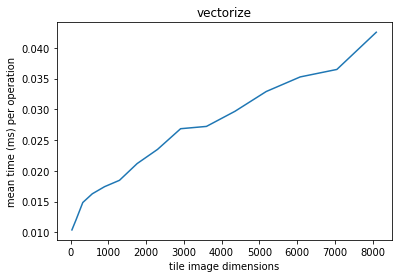

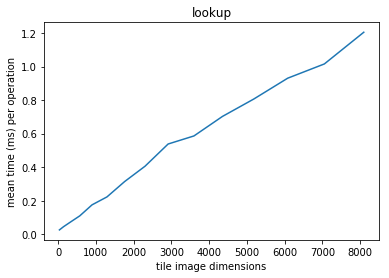

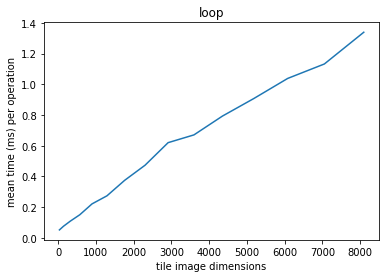

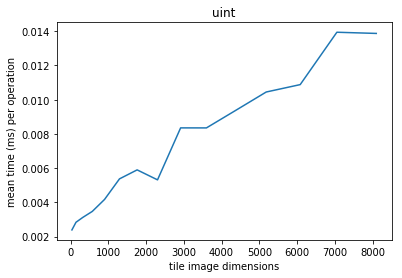

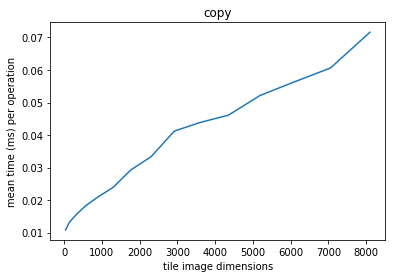

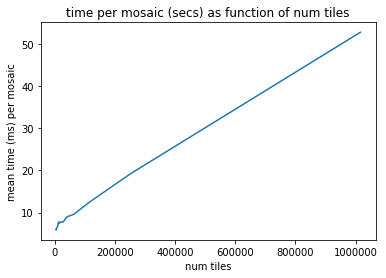

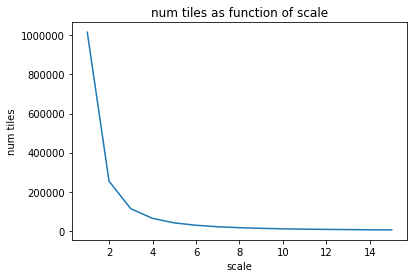

In [29]:
run performance.py \
    --target "media/example/dubrovnik.jpg" \
    --codebook-dir media/pics/ \
    --min-scale 1 \
    --max-scale 15

In [30]:
zip(scales, num_tiles)

[(1, 1016064),
 (2, 254016),
 (3, 112896),
 (4, 63504),
 (5, 40468),
 (6, 28224),
 (7, 20736),
 (8, 15792),
 (9, 12516),
 (10, 10050),
 (11, 8296),
 (12, 7056),
 (13, 5974),
 (14, 5184),
 (15, 4450)]

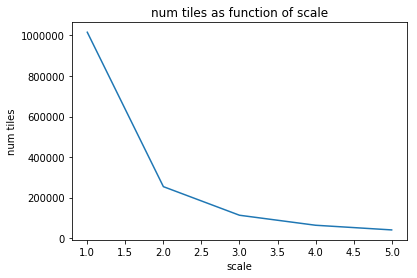

In [28]:
plt.clf()
plt.plot(scales, num_tiles)
plt.title('num tiles as function of scale')
plt.ylabel("num tiles")
plt.xlabel("scale")
plt.show()

=== Creating Mosaic Image ===
Images=media/pics/, target=media/example/beach.jpg, scale=13, aspect_ratio=1.3333, vectorization=1, randomness=0.00
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Writing mosaic image to 'media/output/beach-mosaic-scale-13.jpg' ...


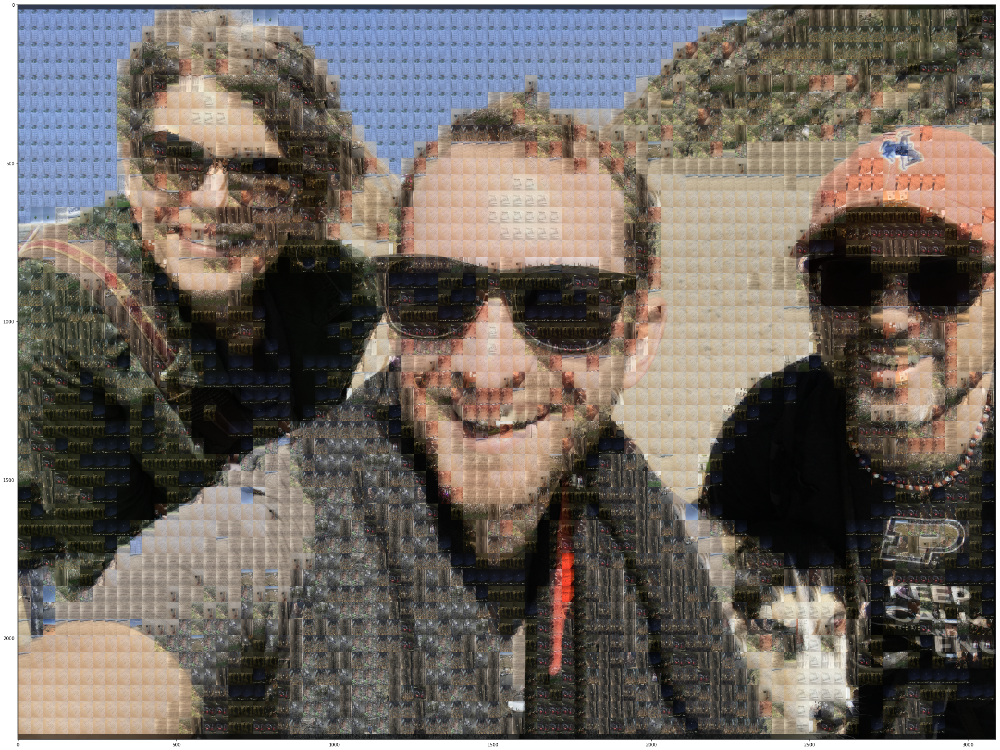

In [17]:
run mosaic.py \
    --target "media/example/beach.jpg" \
    --savepath "media/output/%s-mosaic-scale-%d.jpg" \
    --codebook-dir media/pics/ \
    --scale 13 \
    --height-aspect 4 \
    --width-aspect 3 \
    --opacity 0.4

In [7]:
content = open(savepath, 'rb').read()
print(len(content))

99693937


In [8]:
import os
import glob
import bz2
import time

import dlib
import cv2
import requests
import numpy as np
import matplotlib.pyplot as plt

def decompress(archive_path):
    try:
        zipfile = bz2.BZ2File(archive_path) # open the file
        data = zipfile.read() # get the decompressed data
        newfilepath = archive_path[:-4] # assuming the filepath ends with .bz2
        print("writing to: %s" % newfilepath)
        open(newfilepath, 'wb').write(data) # write a uncompressed file
        return newfilepath
    except Exception as e:
        print("ERROR:", e)
        return None

# download face detection weights
savepath = '/tmp/shape_predictor_68_face_landmarks.dat'
if not os.path.exists(savepath):
    print("Downloading face weights...")
    weights_url = "http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2"
    r = requests.get(weights_url, allow_redirects=True)
    open(savepath + ".bz2", 'wb').write(r.content)
    print("Found weights!")
    decompress(savepath)

    
# setup 
starttime = time.time()
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(savepath)
elapsed = time.time() - starttime
print("Took %.4f secs to load dlib face detector" % elapsed)

# for each picture
paths = glob.glob('media/pics/*.jpg')
for p in paths:
    img = cv2.imread(p)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    detecttime = time.time()
    rects = detector(gray, 1)
    elapsed = time.time() - detecttime
    print("Took %.4f secs to detect" % elapsed)
    break

Took 1.4852 secs to load dlib face detector
Took 3.3842 secs to detect


In [ ]:
WEIGHTS_PATH = '/tmp/shape_predictor_68_face_landmarks.dat'

class DlibFace(object):
    def __init__(self, opencv_rect, bb, keypoints, downsize):
        self.rect = opencv_rect
        self.bb = bb  # (x, y, w, h)
        self.x, self.y, self.w, self.h = bb
        self.keypoints = keypoints
        self.downsize = downsize

def detect_faces_dlib(img, weights_path=WEIGHTS_PATH, downsize=0.25):
    """
    img: np.array of image
    weights_path: path to dlib predictor weights path
    downsize: how much to shrink image before detecting/predicting - this is 
        for performance (smaller => faster)
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(img, None, fx=downsize, fy=downsize, interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
    rects = detector(gray, 1)
    if len(rects) == 0:
        continue
      
    # get facial landmarks
    total_face_pixels = 0
    total_pixels = resized.shape[0] * resized.shape[1]
    faces = []
    for rect in rects:
        # get bounding box
        bb = rect_to_bb(rect)
        
        # get facial keypoints
        keypoint_coordinates = shape_to_np(predictor(gray, rect))
        
        # calculate number of pixels in the bounding box
        total_face_pixels += (w * h)
        
        # create & save face
        face = DlibFace(rect, bb, keypoint_coordinates, downsize)
        faces.append(face)
        
    percentage_face = 1.0 - total_pixels - total_face_pixels
    return faces, percentage_face
        

In [41]:
# !bzip2 -dk /tmp/shape_predictor_68_face_landmarks.dat.bz2
archive_path = '/tmp/shape_predictor_68_face_landmarks.dat.bz2'
zipfile = bz2.BZ2File(archive_path)
data = zipfile.read()

In [2]:
!mv /tmp/shape_predictor_68_face_landmarks.dat weights/shape_predictor_68_face_landmarks.dat

In [42]:
newfilepath = archive_path[:-4]

Setting up detector...
Iterating through pics...
('media/pics/2016-03-24 14.20.07.jpg', '...')
('media/pics/2016-03-24 14.22.16.jpg', '...')
('media/pics/2016-03-24 14.43.28.jpg', '...')
('media/pics/2016-03-24 15.11.45.jpg', '...')


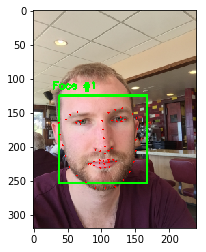

keep going?1
('media/pics/2016-03-24 15.11.51.jpg', '...')
('media/pics/2016-03-24 15.57.28.jpg', '...')
('media/pics/2016-03-24 15.59.49.jpg', '...')
('media/pics/2016-03-24 16.10.04.jpg', '...')
('media/pics/2016-03-24 16.11.18.jpg', '...')


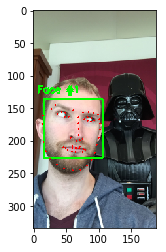

keep going?1
('media/pics/2016-03-24 16.12.36.jpg', '...')


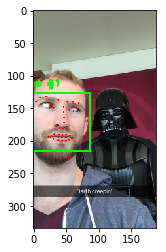

keep going?1
('media/pics/2016-03-24 16.29.36.jpg', '...')
('media/pics/2016-03-25 07.33.05.jpg', '...')
('media/pics/2016-03-25 12.45.30.jpg', '...')
('media/pics/2016-03-25 15.00.17.jpg', '...')
('media/pics/2016-03-25 15.01.19.jpg', '...')
('media/pics/2016-03-25 15.04.09.jpg', '...')
('media/pics/2016-03-25 15.23.25.jpg', '...')
('media/pics/2016-03-25 15.24.52.jpg', '...')
('media/pics/2016-03-25 15.26.22.jpg', '...')
('media/pics/2016-03-25 15.53.09.jpg', '...')
('media/pics/2016-03-25 20.45.01.jpg', '...')
('media/pics/2016-03-25 20.45.05.jpg', '...')
('media/pics/2016-03-26 09.51.53.jpg', '...')
('media/pics/2016-03-26 10.04.32.jpg', '...')
('media/pics/2016-03-26 10.04.34.jpg', '...')
('media/pics/2016-03-26 10.04.37.jpg', '...')
('media/pics/2016-03-26 10.14.19.jpg', '...')
('media/pics/2016-03-26 10.15.28.jpg', '...')
('media/pics/2016-03-26 10.16.54.jpg', '...')
('media/pics/2016-03-26 10.19.39.jpg', '...')


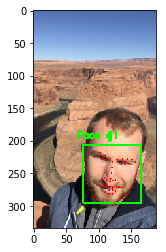

keep going?1
('media/pics/2016-03-26 10.32.31.jpg', '...')
('media/pics/2016-03-26 10.32.34.jpg', '...')
('media/pics/2016-03-26 10.32.36.jpg', '...')
('media/pics/2016-03-26 10.32.38.jpg', '...')
('media/pics/2016-03-26 10.40.12.jpg', '...')
('media/pics/2016-03-26 11.47.58.jpg', '...')
('media/pics/2016-03-26 11.48.09.jpg', '...')
('media/pics/2016-03-26 11.49.47.jpg', '...')
('media/pics/2016-03-26 11.55.18.jpg', '...')
('media/pics/2016-03-26 11.55.20.jpg', '...')
('media/pics/2016-03-26 11.56.16.jpg', '...')
('media/pics/2016-03-26 11.56.19.jpg', '...')
('media/pics/2016-03-26 12.26.12.jpg', '...')
('media/pics/2016-03-26 13.51.42.jpg', '...')
('media/pics/2016-03-26 13.51.44.jpg', '...')
('media/pics/2016-03-26 14.02.51.jpg', '...')
('media/pics/2016-03-26 14.37.33.jpg', '...')
('media/pics/2016-03-26 14.43.43.jpg', '...')
('media/pics/2016-03-26 14.43.46.jpg', '...')
('media/pics/2016-03-26 14.43.48.jpg', '...')
('media/pics/2016-03-26 14.43.52.jpg', '...')
('media/pics/2016-03-

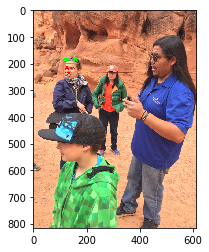

keep going?1
('media/pics/2016-03-27 13.07.58.jpg', '...')


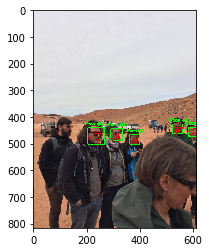

keep going?1
('media/pics/2016-03-27 13.08.01.jpg', '...')
('media/pics/2016-03-27 13.10.12.jpg', '...')
('media/pics/2016-03-27 13.15.04.jpg', '...')
('media/pics/2016-03-27 13.15.21.jpg', '...')
('media/pics/2016-03-27 13.15.36.jpg', '...')
('media/pics/2016-03-27 13.16.13.jpg', '...')
('media/pics/2016-03-27 13.16.34.jpg', '...')
('media/pics/2016-03-27 13.17.56.jpg', '...')
('media/pics/2016-03-27 13.19.10.jpg', '...')
('media/pics/2016-03-27 13.19.44.jpg', '...')
('media/pics/2016-03-27 13.19.57.jpg', '...')
('media/pics/2016-03-27 13.20.05.jpg', '...')
('media/pics/2016-03-27 13.22.09.jpg', '...')
('media/pics/2016-03-27 13.27.45.jpg', '...')
('media/pics/2016-03-27 13.27.48.jpg', '...')
('media/pics/2016-03-27 13.27.49.jpg', '...')


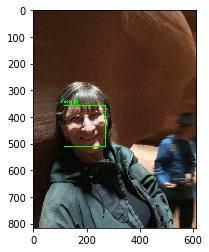

keep going?0


In [84]:
# setup 
print("Setting up detector...")
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(savepath)

def rect_to_bb(rect):
    # https://www.pyimagesearch.com/2017/04/03/facial-landmarks-dlib-opencv-python/
	# take a bounding predicted by dlib and convert it
	# to the format (x, y, w, h) as we would normally do
	# with OpenCV
	x = rect.left()
	y = rect.top()
	w = rect.right() - x
	h = rect.bottom() - y
	return (x, y, w, h)

def shape_to_np(shape):
    # https://www.pyimagesearch.com/2017/04/03/facial-landmarks-dlib-opencv-python/
	# initialize the list of (x, y)-coordinates
	coords = np.zeros((68, 2), dtype=np.int64)
 
	# loop over the 68 facial landmarks and convert them
	# to a 2-tuple of (x, y)-coordinates
	for i in range(0, 68):
		coords[i] = (shape.part(i).x, shape.part(i).y)
 
	# return the list of (x, y)-coordinates
	return coords

# for each picture
print("Iterating through pics...")
paths = glob.glob('media/pics/*.jpg')
for p in paths:
    print(p, "...")
    img = cv2.imread(p)
    resized = cv2.resize(img, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
    rects = detector(gray, 1)
    if len(rects) == 0:
        continue
        
    # loop over the face detections
    for (i, rect) in enumerate(rects):
        # determine the facial landmarks for the face region, then
        # convert the facial landmark (x, y)-coordinates to a NumPy
        # array
        shape = predictor(gray, rect)
        shape = shape_to_np(shape)

        # convert dlib's rectangle to a OpenCV-style bounding box
        # [i.e., (x, y, w, h)], then draw the face bounding box
        (x, y, w, h) = rect_to_bb(rect)
        cv2.rectangle(resized, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # show the face number
        cv2.putText(resized, "Face #{}".format(i + 1), (x - 10, y - 10),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # loop over the (x, y)-coordinates for the facial landmarks
        # and draw them on the image
        for (x, y) in shape:
            cv2.circle(resized, (x, y), 1, (0, 0, 255), -1)
        
    plt.imshow(resized[:, :, [2,1,0]], interpolation='nearest', cmap='gray')
    plt.show(block=False)
    inp = input('keep going?')
    if inp == 1:
        continue
    break
    
cv2.destroyAllWindows()

=== Creating Mosaic Image ===
Images=media/pics/, target=media/example/beach.jpg, scale=10, aspect_ratio=1.3333, vectorization=1, randomness=0.00, faces=True
Caching is ON, checking for previously cached index...
Found cached index, reading from disk...
Writing mosaic image to 'media/output/beach-mosaic-scale-10.jpg' ...


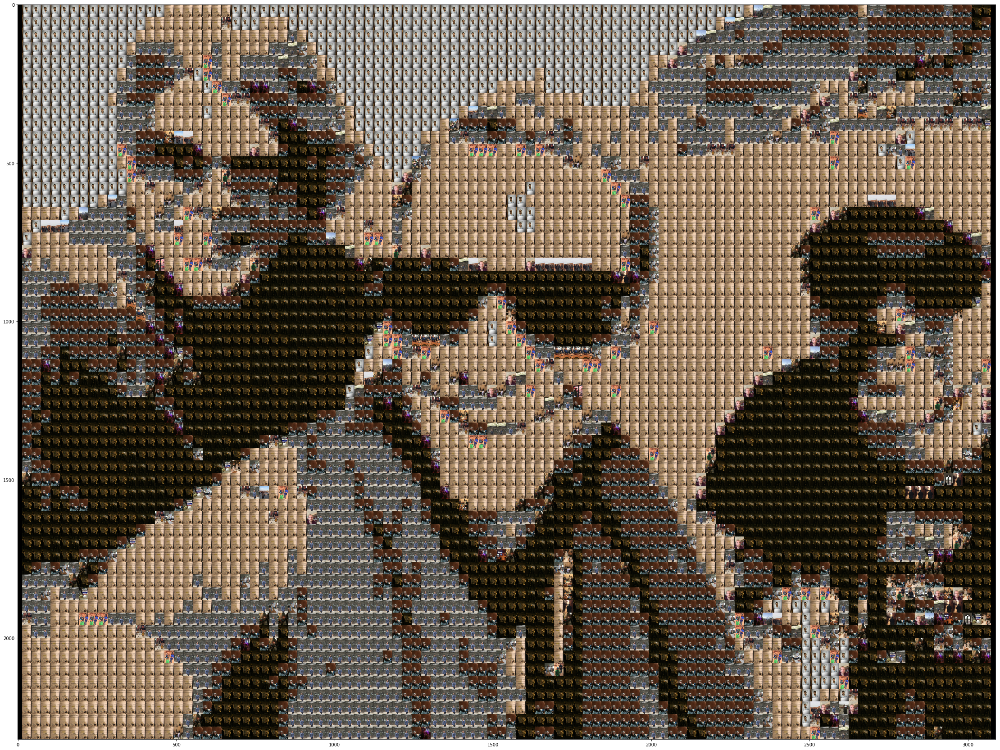

In [4]:
run mosaic.py \
        --target "media/example/beach.jpg" \
        --savepath "media/output/%s-mosaic-scale-%d.jpg" \
        --codebook-dir media/pics/ \
        --scale 10 \
        --height-aspect 4 \
        --width-aspect 3 \
        --opacity 0.0 \
        --detect-faces

<Figure size 432x288 with 0 Axes>

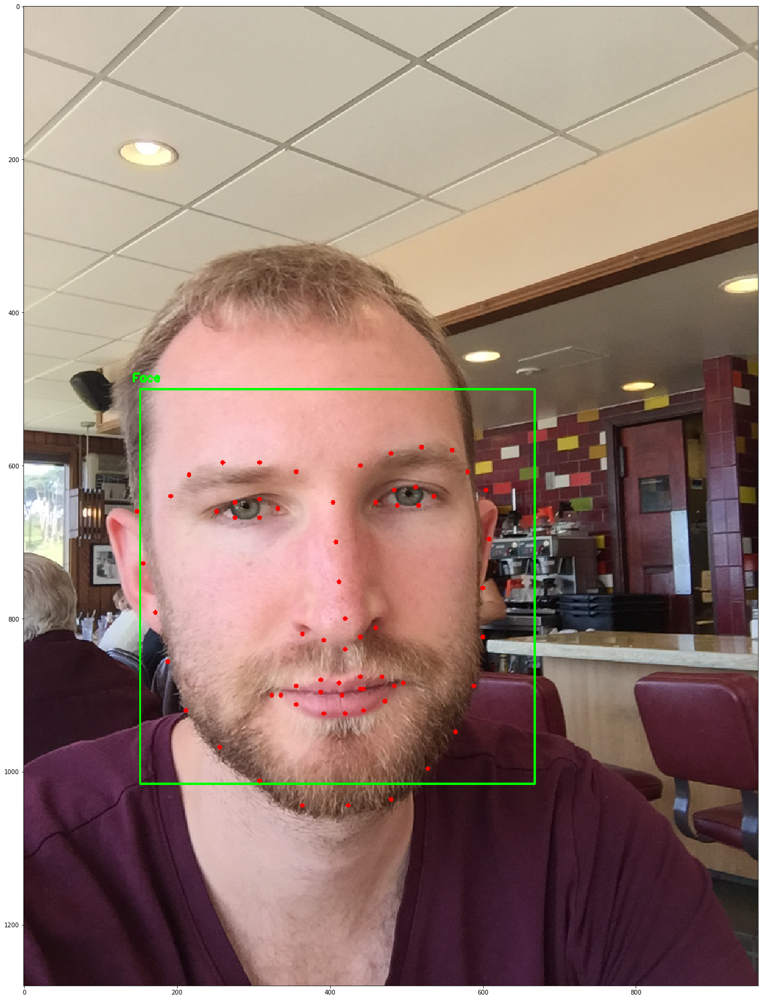

In [17]:
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

class DlibFace(object):
    def __init__(self, opencv_rect, bb, keypoints, downsize, shape):
        self.rect = opencv_rect
        self.bb = bb  # (x, y, w, h)
        self.x, self.y, self.w, self.h = bb
        self.keypoints = keypoints
        self.downsize = downsize
        self.upsize = 1.0 / self.downsize
        self.original_shape = shape  # size of original image

    def mark_image(self, img):
        (x, y, w, h) = self.bb
        cv2.rectangle(img, 
            (int(x * self.upsize), int(y * self.upsize)), 
            (int(self.upsize * (x + w)), int(self.upsize * (y + h))), 
            (0, 255, 0), 2)

        # show the face number
        cv2.putText(img, "Face", (int(x * self.upsize - 10), int(y * self.upsize - 10)),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # loop over the (x, y)-coordinates for the facial landmarks
        # and draw them on the image
        for (x, y) in self.keypoints:
            cv2.circle(img, (int(x * self.upsize), int(y * self.upsize)), 3, (0, 0, 255), -1)

        return img

def rect_to_bb(rect):
    # https://www.pyimagesearch.com/2017/04/03/facial-landmarks-dlib-opencv-python/
    # take a bounding predicted by dlib and convert it
    # to the format (x, y, w, h) as we would normally do
    # with OpenCV
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y
    return (x, y, w, h)

def shape_to_np(shape):
    # https://www.pyimagesearch.com/2017/04/03/facial-landmarks-dlib-opencv-python/
    # initialize the list of (x, y)-coordinates
    coords = np.zeros((68, 2), dtype=np.int64)
 
    # loop over the 68 facial landmarks and convert them
    # to a 2-tuple of (x, y)-coordinates
    for i in range(0, 68):
        coords[i] = (shape.part(i).x, shape.part(i).y)
 
    # return the list of (x, y)-coordinates
    return coords
    
# dlib stuff
downsize = 0.25
WEIGHTS_PATH = 'weights/shape_predictor_68_face_landmarks.dat'
upsample_multiple = 1

img = cv2.imread('media/pics/2016-03-24 15.11.45.jpg')
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(WEIGHTS_PATH)

resized = cv2.resize(img, None, fx=downsize, fy=downsize, interpolation=cv2.INTER_AREA)
gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
rects = detector(gray, upsample_multiple)

# get facial landmarks
total_face_pixels = 0
total_pixels = resized.shape[0] * resized.shape[1]
faces = []
for rect in rects:
    # get bounding box
    bb = rect_to_bb(rect)
    (x, y, w, h) = bb

    # get facial keypoints
    raw_kps = predictor(gray, rect)
    keypoint_coordinates = shape_to_np(raw_kps)

    # calculate number of pixels in the bounding box
    total_face_pixels += (w * h)

    # create & save face
    original_shape = (resized.shape[0], resized.shape[1])
    face = DlibFace(rect, bb, keypoint_coordinates, downsize, original_shape)
    faces.append(face)

percentage_face = float(total_face_pixels) / total_pixels

# display
img = cv2.imread('media/pics/2016-03-24 15.11.45.jpg')
faces, perc = detect_faces_dlib(img)
for face in faces:
    img = face.mark_image(img)

plt.clf()
plt.figure(figsize = (64, 30))
plt.imshow(img[:, :, [2, 1, 0]])

<Figure size 432x288 with 0 Axes>

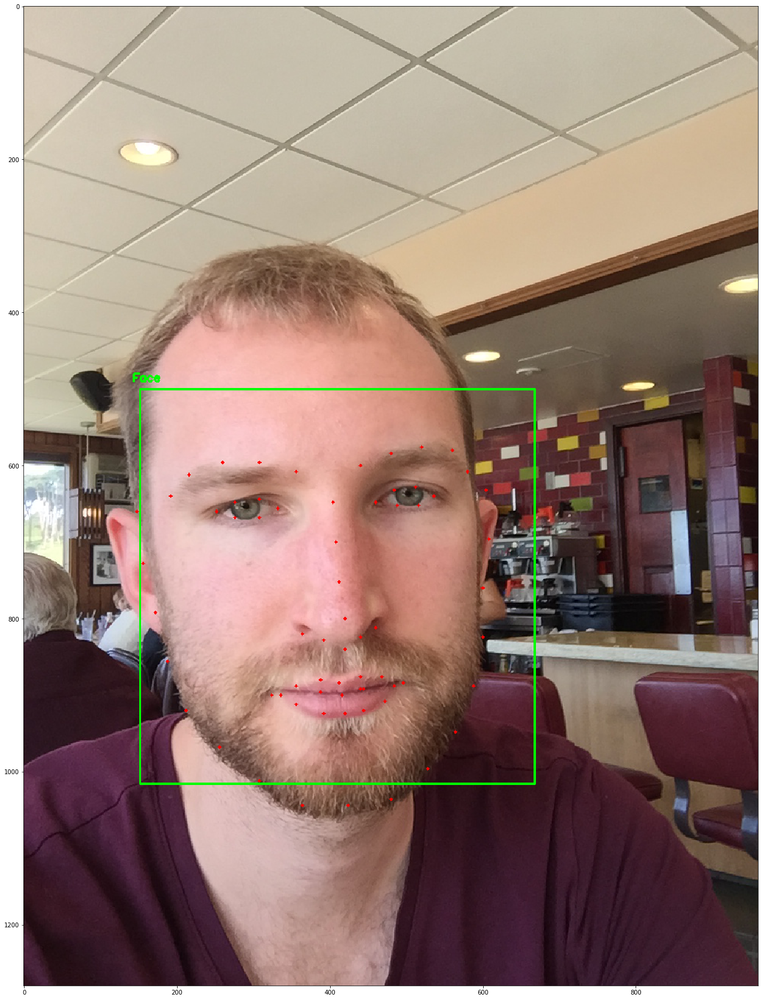

In [2]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt

from emosaic.faces import detect_faces_dlib

# display
img = cv2.imread('media/pics/2016-03-24 15.11.45.jpg')
faces, perc = detect_faces_dlib(img)
for face in faces:
    img = face.mark_image(img)

plt.clf()
plt.figure(figsize = (64, 30))
plt.imshow(img[:, :, [2, 1, 0]])